# CA3

### Imports

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score
from sklearn.impute import SimpleImputer
from sklearn.ensemble import RandomForestClassifier


### Reading data

In [3]:
df = pd.read_csv("assets/train.csv", index_col=0) # First column as row index

### Data exploration and visualisation

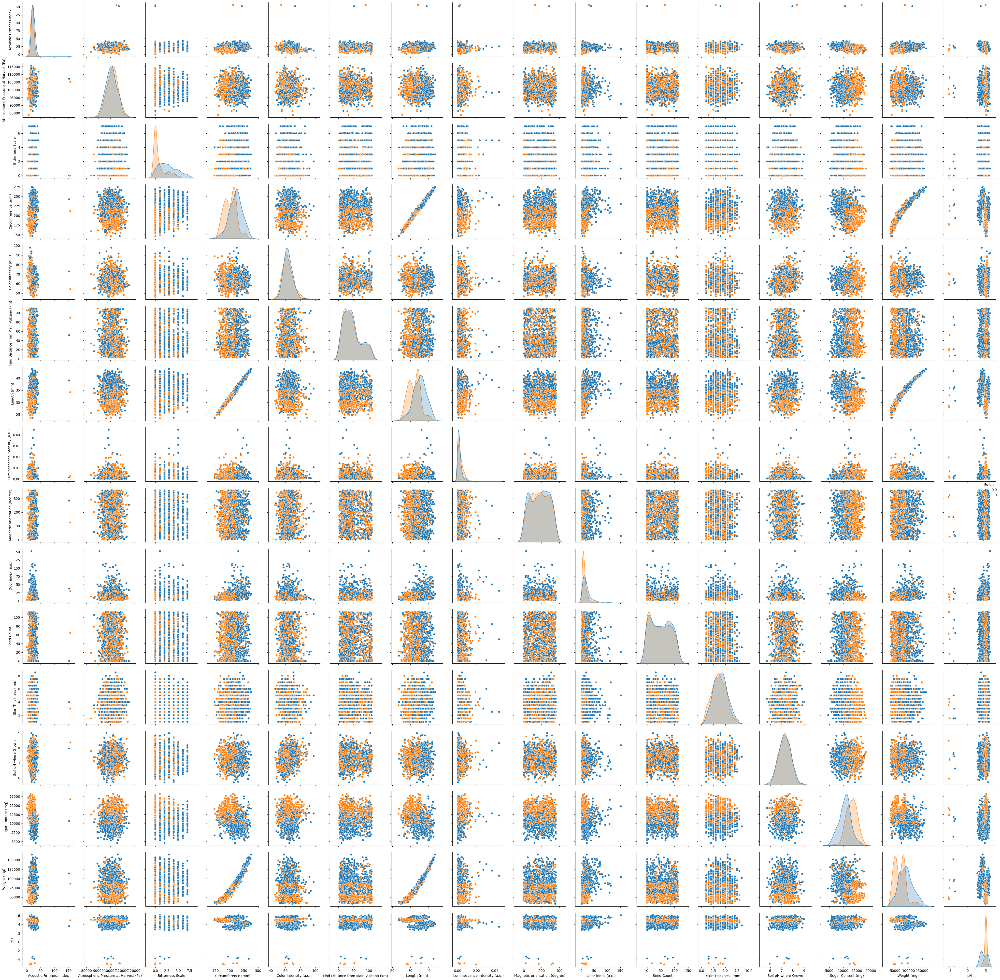

       Acoustic Firmness Index  Atmospheric Pressure at Harvest (Pa)  \
count              1245.000000                           1248.000000   
mean                 21.570077                         101327.543269   
std                   8.131888                           4772.582203   
min                   0.600000                          83825.000000   
25%                  17.300000                          98095.750000   
50%                  21.300000                         101357.000000   
75%                  25.300000                         104470.750000   
max                 156.520701                         115636.000000   

       Bitterness Scale  Circumference (mm)  Color Intensity (a.u.)  \
count       1244.000000         1246.000000             1248.000000   
mean           1.808682          211.046062               63.300962   
std            1.960279           24.652278                7.118135   
min            0.000000          145.867667               46.060000

In [4]:
# Visualize the data
sns.pairplot(df, hue="Edible")
plt.tight_layout()
plt.show()

print(df.describe())

From the plots we can see that the data is not linearly separable, meaning that we will have a better model if we use a non-linear model.

### Data cleaning

In [5]:
# Replace missing values with the mean of the column
columns = df.columns
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
imputer.fit(df.values)
df = imputer.transform(df.values)
df = pd.DataFrame(df, columns=columns)

# Remove outliers
for i in df.columns:
    z_scores = (df[i] - np.mean(df[i])) / np.std(df[i])
    df_clean = df[np.abs(z_scores) < 1]

### Data preprocessing and visualisation

In [6]:
# Split training into training and testing data
y = df["Edible"]
X = df.drop(columns="Edible")

X_train, X_test, y_train, y_test = train_test_split(X, y, random_state=0, stratify=y)

# Scale and standardize the data for better performance
sc = StandardScaler()
sc.fit(X_train)

X_train_sc = sc.transform(X_train)
X_test_sc = sc.transform(X_test)

### Modelling

In [7]:
# Test different number of estimators to find the best model
for i in range(1, 50):
    rf = RandomForestClassifier(n_estimators=i, random_state=0) #37, 22
    rf.fit(X_train_sc, y_train)
    y_pred = rf.predict(X_test_sc)
    print("rf", accuracy_score(y_test, y_pred), i)

rf 0.842948717948718 1
rf 0.8301282051282052 2
rf 0.8878205128205128 3
rf 0.8814102564102564 4
rf 0.8974358974358975 5
rf 0.8878205128205128 6
rf 0.8942307692307693 7
rf 0.8878205128205128 8
rf 0.9038461538461539 9
rf 0.9038461538461539 10
rf 0.8974358974358975 11
rf 0.907051282051282 12
rf 0.9038461538461539 13
rf 0.907051282051282 14
rf 0.907051282051282 15
rf 0.9038461538461539 16
rf 0.9038461538461539 17
rf 0.9102564102564102 18
rf 0.907051282051282 19
rf 0.907051282051282 20
rf 0.9102564102564102 21
rf 0.9102564102564102 22
rf 0.907051282051282 23
rf 0.9102564102564102 24
rf 0.9102564102564102 25
rf 0.9102564102564102 26
rf 0.9102564102564102 27
rf 0.9102564102564102 28
rf 0.9102564102564102 29
rf 0.9102564102564102 30
rf 0.9102564102564102 31
rf 0.9102564102564102 32
rf 0.9102564102564102 33
rf 0.907051282051282 34
rf 0.907051282051282 35
rf 0.907051282051282 36
rf 0.907051282051282 37
rf 0.907051282051282 38
rf 0.907051282051282 39
rf 0.9038461538461539 40
rf 0.907051282051282 4

Since multiple estimators give the same accuracy, we will use the one that has the least complexity, to make sure that the model is not overfitting.

### Final evaluation

In [8]:
df = pd.read_csv("assets/train.csv", index_col=0) 

# Transform and mangage the data as before
columns = df.columns
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
imputer.fit(df.values)
df = imputer.transform(df.values)
df = pd.DataFrame(df, columns=columns)

for i in df.columns:
    z_scores = (df[i] - np.mean(df[i])) / np.std(df[i])
    df_clean = df[np.abs(z_scores) < 1]

# Testing on the whole dataset
df_y = df["Edible"]
df_x = df.drop(columns="Edible")

# Scale and standardize the data for better performance
sc = StandardScaler()
sc.fit(df_x)
df_x_sc = sc.transform(df_x)

rf = RandomForestClassifier(n_estimators=18, random_state=0) # n_estimators found from previous test
rf.fit(df_x_sc, df_y)

df_train_ped = rf.predict(df_x_sc)
print(accuracy_score(df_train_ped, df_y)) # Test accuracy for training data

0.9975961538461539


### Kaggle submission

In [9]:
df = pd.read_csv("assets/test.csv", index_col=0)

# Transform and mangage the data as before
columns = df.columns
imputer = SimpleImputer(missing_values=np.nan, strategy='mean')
imputer.fit(df.values)
df = imputer.transform(df.values)
df = pd.DataFrame(df, columns=columns)

for i in df.columns:
    z_scores = (df[i] - np.mean(df[i])) / np.std(df[i])
    df_clean = df[np.abs(z_scores) < 1]

# Scale and standardize the data the same way as the training data
df_test_sc = sc.transform(df)
df_test_pred = rf.predict(df_test_sc)

# Save the results to a csv file
df_results = pd.DataFrame(data=df_test_pred.astype(int), columns=["Edible"])
df_results.index.names = ["index"]
df_results.to_csv('assets/results.csv')